Visão Computacional: Deteccção de faces utilizando OpenCV


In [1]:
import cv2 #openCV
from google.colab.patches import cv2_imshow #habilitando o imshow no colab

In [5]:
imagem = cv2.imread('people1.jpg')
imagem.shape

(1280, 1920, 3)

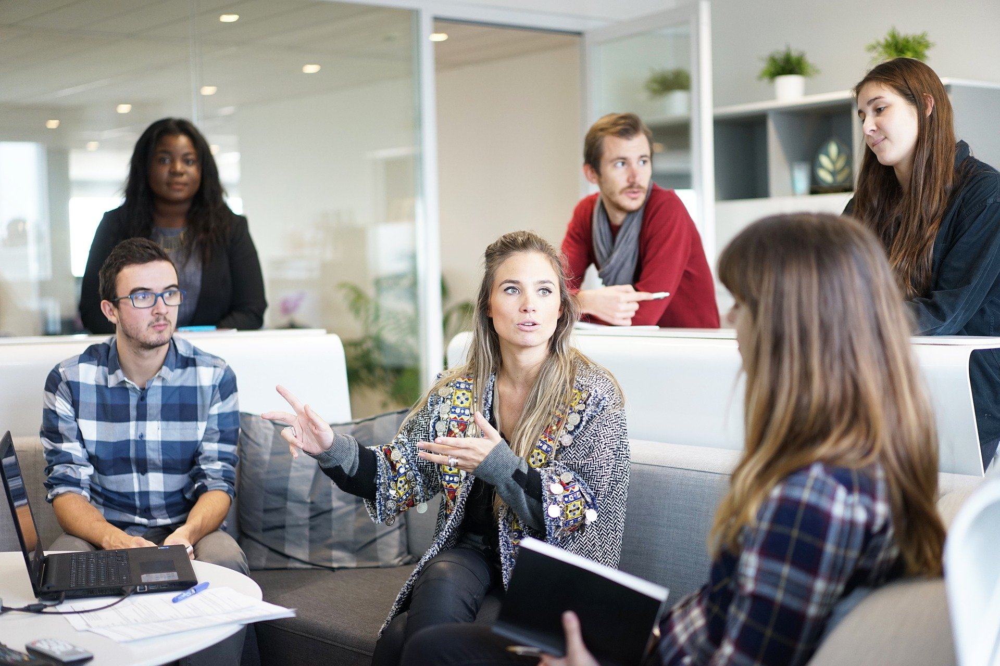

In [6]:
cv2_imshow(imagem)

Processamento da imagem para melhorar a performance

In [7]:
#reduzindo a resolução
imagem = cv2.resize(imagem, (800,600))
imagem.shape

(600, 800, 3)

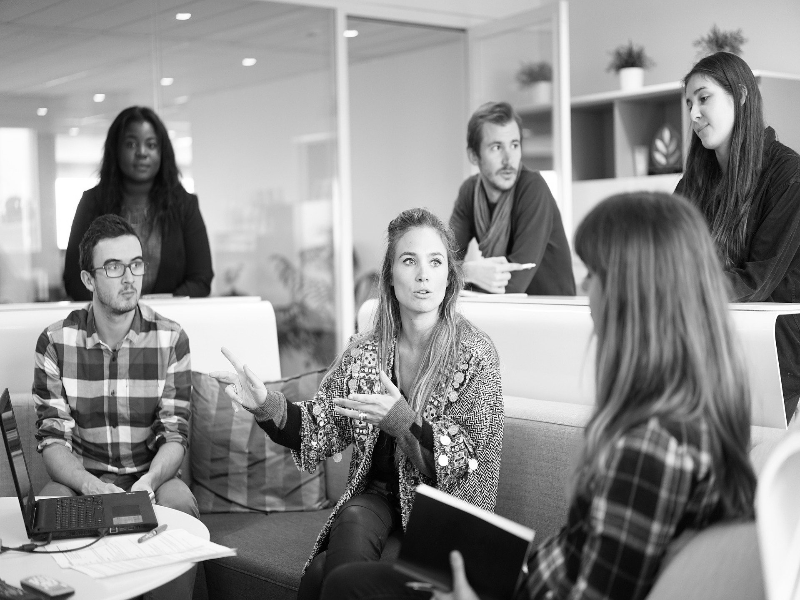

In [8]:
#transformando em escala de cinza
img_cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)
cv2_imshow(img_cinza)

Defindo o classificador e gerando as detecções

In [10]:
detector_facial = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
deteccoes = detector_facial.detectMultiScale(img_cinza, scaleFactor = 1.08)

In [11]:
deteccoes

array([[679,  74,  66,  66],
       [114, 123,  54,  54],
       [476, 123,  59,  59],
       [386, 232,  74,  74],
       [ 89, 238,  68,  68]], dtype=int32)

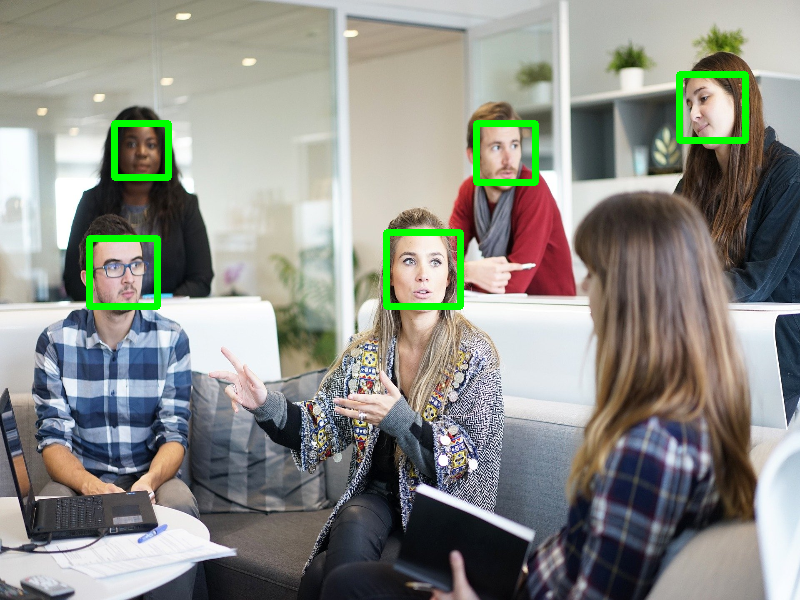

In [14]:
#plotando as detecções na imagem original
for x,y,w,h in deteccoes:
  cv2.rectangle(imagem, (x, y), (x+w,y+h), (0,255,0), 5)
cv2_imshow(imagem)

Testando nova imagem e novos parâmetros

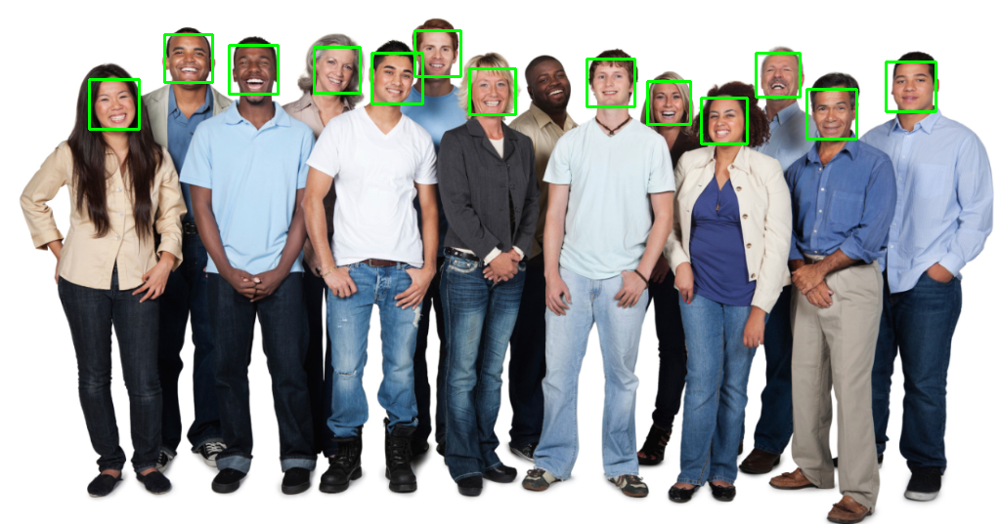

In [15]:
imagem2 = cv2.imread('people2.jpg')
img2_cinza = cv2.cvtColor(imagem2, cv2.COLOR_BGR2GRAY)

deteccoes2 = detector_facial.detectMultiScale(img2_cinza, scaleFactor=1.2, minNeighbors=3, minSize=(32,32), maxSize=(100,100))

for x, y, w, h in deteccoes2:
  cv2.rectangle(imagem2, (x,y), (x+w, y+h), (0,255,0), 2)
cv2_imshow(imagem2)

Detecção dos olhos

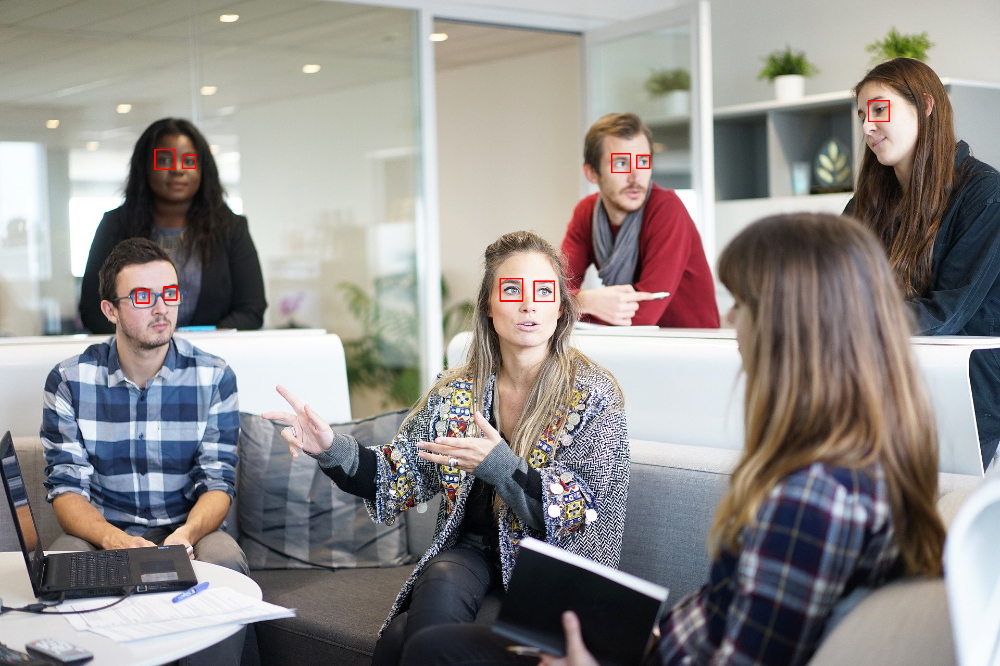

In [16]:
imagem = cv2.imread('people1.jpg')
imagem_cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

detector_olhos = cv2.CascadeClassifier('haarcascade_eye.xml')#novo classificador p/ os olhos
deteccoes_olhos = detector_olhos.detectMultiScale(imagem_cinza, scaleFactor=1.09, minNeighbors=10, maxSize=(70,70))

for x,y,w,h in deteccoes_olhos:
  cv2.rectangle(imagem, (x,y), (x+w, y+h), (0,0,255),2 )

cv2_imshow(imagem)

Combinando as detecções

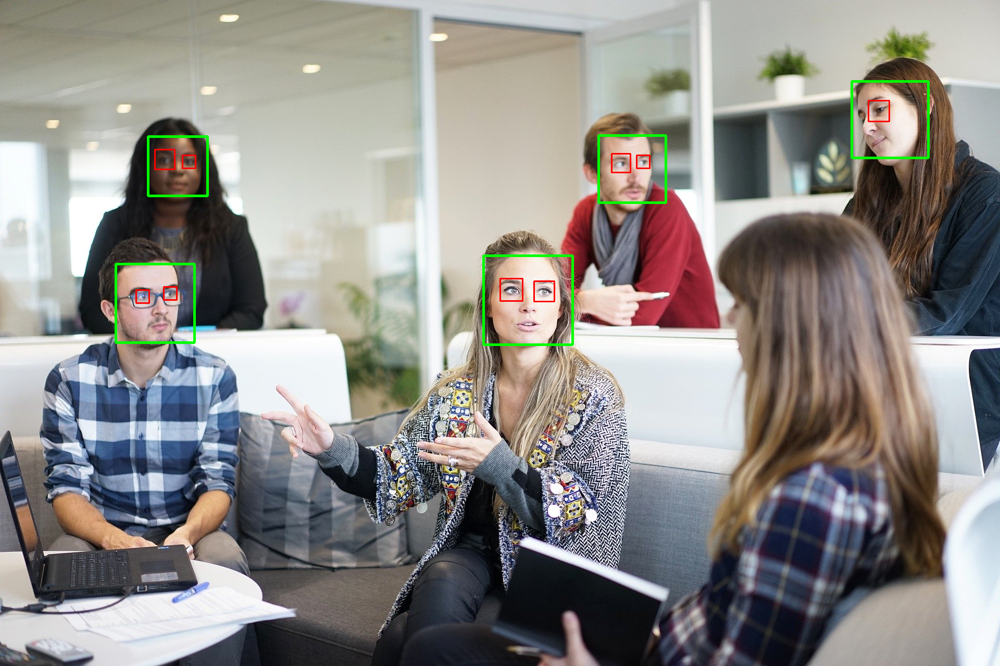

In [17]:
imagem = cv2.imread('people1.jpg')
imagem_cinza = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

deteccoes_faces = detector_facial.detectMultiScale(imagem_cinza, scaleFactor = 1.3, minSize=(30,30))
deteccoes_olhos = detector_olhos.detectMultiScale(imagem_cinza, scaleFactor=1.09, minNeighbors=10, maxSize=(70,70))

for x,y,w,h in deteccoes_faces:
  cv2.rectangle(imagem, (x,y), (x+w, y+h), (0,255,0), 4)
for x,y,w,h in deteccoes_olhos:
  cv2.rectangle(imagem, (x,y), (x+w, y+h), (0,0,255),2 )

cv2_imshow(imagem)